# Exploratory Data Analysis of Unsplash Dataset

---

### Imports and DataFrame

#### Imports

In [16]:
import os
import requests
import numpy as np
import pandas as pd

from io import BytesIO
from PIL import Image

#### DataFrame

In [3]:
df = pd.read_csv("photos.tsv000", sep='\t', header=0)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 31 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   photo_id                        25000 non-null  object 
 1   photo_url                       25000 non-null  object 
 2   photo_image_url                 25000 non-null  object 
 3   photo_submitted_at              25000 non-null  object 
 4   photo_featured                  25000 non-null  object 
 5   photo_width                     25000 non-null  int64  
 6   photo_height                    25000 non-null  int64  
 7   photo_aspect_ratio              25000 non-null  float64
 8   photo_description               10902 non-null  object 
 9   photographer_username           25000 non-null  object 
 10  photographer_first_name         25000 non-null  object 
 11  photographer_last_name          23418 non-null  object 
 12  exif_camera_make                

In [4]:
df.head()

,photo_id,photo_url,photo_image_url,photo_submitted_at,photo_featured,photo_width,photo_height,photo_aspect_ratio,photo_description,photographer_username,...,photo_location_country,photo_location_city,stats_views,stats_downloads,ai_description,ai_primary_landmark_name,ai_primary_landmark_latitude,ai_primary_landmark_longitude,ai_primary_landmark_confidence,blur_hash
0,XMyPniM9LF0,https://unsplash.com/photos/XMyPniM9LF0,https://images.unsplash.com/uploads/1411949294...,2014-09-29 00:08:38.594364,t,4272,2848,1.50,Woman exploring a forest,michellespencer77,...,NaN,NaN,2375421,6967,woman walking in the middle of forest,NaN,NaN,NaN,NaN,L56bVcRRIWMh.gVunlS4SMbsRRxr
1,rDLBArZUl1c,https://unsplash.com/photos/rDLBArZUl1c,https://images.unsplash.com/photo-141633941111...,2014-11-18 19:36:57.08945,t,3000,4000,0.75,Succulents in a terrarium,ugmonk,...,NaN,NaN,13784815,82141,succulent plants in clear glass terrarium,NaN,NaN,NaN,NaN,LvI$4txu%2s:_4t6WUj]xat7RPoe
2,cNDGZ2sQ3Bo,https://unsplash.com/photos/cNDGZ2sQ3Bo,https://images.unsplash.com/photo-142014251503...,2015-01-01 20:02:02.097036,t,2564,1710,1.50,Rural winter mountainside,johnprice,...,NaN,NaN,1302461,3428,rocky mountain under gray sky at daytime,NaN,NaN,NaN,NaN,LhMj%NxvM{t7_4t7aeoM%2M{ozj[
3,iuZ_D1eoq9k,https://unsplash.com/photos/iuZ_D1eoq9k,https://images.unsplash.com/photo-141487280988...,2014-11-01 20:15:13.410073,t,2912,4368,0.67,Poppy seeds and flowers,krisatomic,...,NaN,NaN,2890238,33704,red common poppy flower selective focus phography,NaN,NaN,NaN,NaN,LSC7DirZAsX7}Br@GEWWmnoLWCnj
4,BeD3vjQ8SI0,https://unsplash.com/photos/BeD3vjQ8SI0,https://images.unsplash.com/photo-141700759404...,2014-11-26 13:13:50.134383,t,4896,3264,1.50,Silhouette near dark trees,jonaseriksson,...,NaN,NaN,8704860,49662,trees during night time,NaN,NaN,NaN,NaN,L25|_:V@0hxtI=W;odae0ht6=^NG


In [6]:
df = df[['photo_id', 'photo_image_url', 'photo_width', 'photo_height']]
df.head()

,photo_id,photo_image_url,photo_width,photo_height
0,XMyPniM9LF0,https://images.unsplash.com/uploads/1411949294...,4272,2848
1,rDLBArZUl1c,https://images.unsplash.com/photo-141633941111...,3000,4000
2,cNDGZ2sQ3Bo,https://images.unsplash.com/photo-142014251503...,2564,1710
3,iuZ_D1eoq9k,https://images.unsplash.com/photo-141487280988...,2912,4368
4,BeD3vjQ8SI0,https://images.unsplash.com/photo-141700759404...,4896,3264


In [17]:
df['photo_image_url'][0]

'https://images.unsplash.com/uploads/14119492946973137ce46/f1f2ebf3'

200


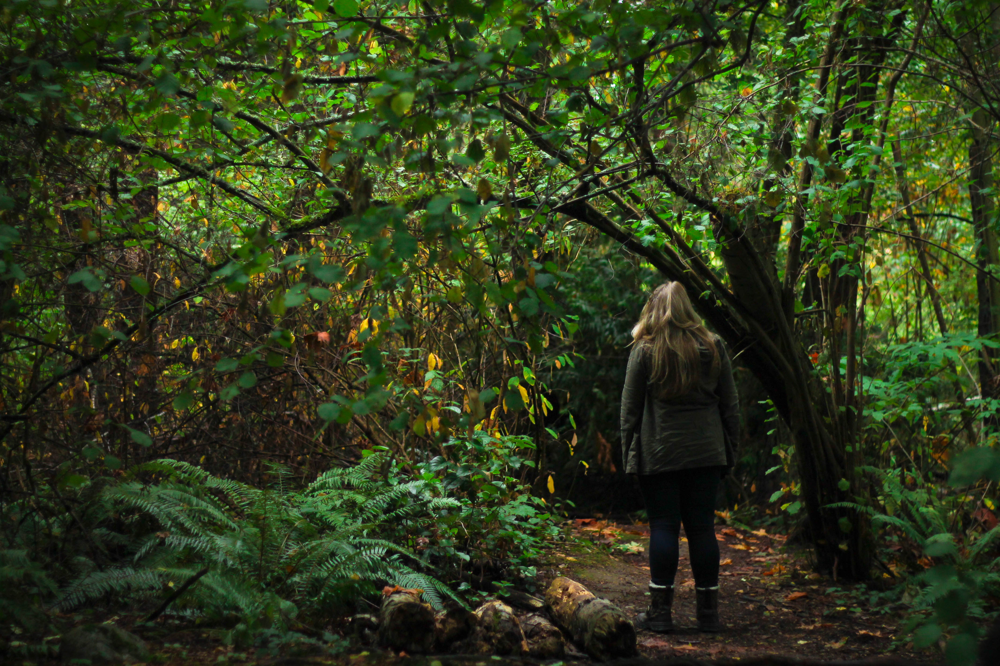

In [20]:
# Downloading Original Image
image_bytes = requests.get(f"{df['photo_image_url'][0]}")
print(image_bytes.status_code)
image_bytes = image_bytes.content
image_stream = BytesIO(image_bytes)
image_open = Image.open(image_stream)

image_open.save(f"{df['photo_id'][0]}.png")

image_open

200


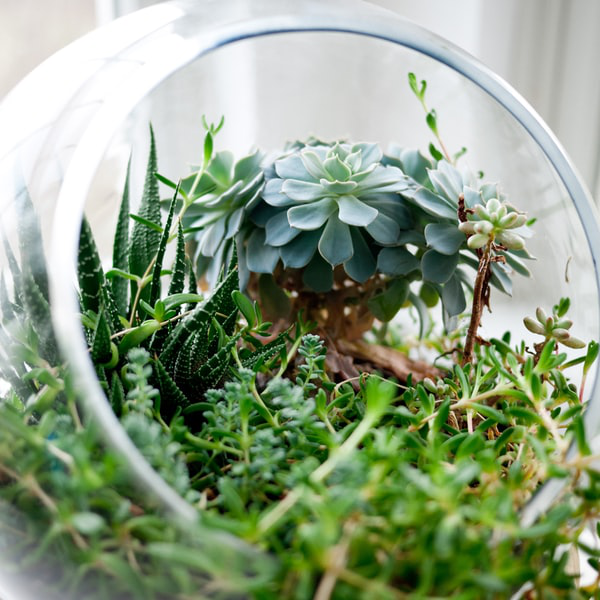

In [32]:
# Scaling Image before Download
image_bytes = requests.get(f"{df['photo_image_url'][1]}?fit=crop&w=600&h=600")
print(image_bytes.status_code)
image_bytes = image_bytes.content
image_stream = BytesIO(image_bytes)
image_open = Image.open(image_stream)

image_open.save(f"{df['photo_id'][1]}_resize.png")

image_open